
###  Projet : Exploration et nettoyage des données

Importation des bibliothèques :

In [ ]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
sns.set(color_codes = True)
from scipy import stats
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Plan

- Visualisation du jeu de données, appropriation des différentes variables -
démarche de nettoyage du jeu de données

- Traitement des valeurs manquantes et abérantes

- Première visualisation des corrélations entre les variables

- Commentaires



## Objectif :  

L'objectif ici est de nettoyer le jeu de donnée afin de pouvoir s'en servir pour analyser diverses corrélation entre les variables.

J'aimerai par exemple pouvoir mettre en lien le taux de sucre ou de gras dans une recette et son appréciation par les utilisateurs.Nous pourrions mettre en relation le temps de préparation et les notes également.
Il serait possible de voir selon les catégories de recettes lesquelles sont les plus longue, les mieux notées, les plus commentées...

Pour ce faire, je vais d'abord traiter les valeurs manquantes et abérantes au sein des différents composant de la recette afin de détecter des erreurs de saisies par exemple.
Je vais ensuite essayer de détecter très largement les premières corrélations entre les variables afin d'avoir un axe de travail fixé à la fin du nettoyage des données.


Importation du jeu de données


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
DATA = pd.read_csv('/content/drive/My Drive/ISDD/Projet/allrecipes.csv',delimiter=',', index_col='name')
DATA.head()[DATA.columns[:45]]

,url,category,author,summary,rating,rating_count,review_count,ingredients,directions,prep,cook,total,servings,yield,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_b6_mg,vitamin_c_mg,folate_mcg,thiamin_mg,riboflavin_mg,vitamin_e_iu_IU,vitamin_k_mcg,biotin_mcg,vitamin_b12_mcg,mono_fat_g,poly_fat_g,trans_fatty_acid_g,omega_3_fatty_acid_g
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Simple Macaroni and Cheese,https://www.allrecipes.com/recipe/238691/simpl...,main-dish,g0dluvsugly,A very quick and easy fix to a tasty side-dish...,4.42,834,575,1 (8 ounce) box elbow macaroni ; ¼ cup butter ...,Bring a large pot of lightly salted water to a...,10 mins,20 mins,30 mins,4,4 servings,630.2,55.0,7.6,33.6,20.9,99.6,26.5,2.1,777.0,302.2,567.9,2.7,61.8,380.0,NaN,NaN,1152.0,10.1,NaN,0.3,165.6,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gourmet Mushroom Risotto,https://www.allrecipes.com/recipe/85389/gourme...,main-dish,Myleen Sagrado Sjödin,Authentic Italian-style risotto cooked the slo...,4.80,3388,2245,"6 cups chicken broth, divided ; 3 tablespoons ...","In a saucepan, warm the broth over low heat. W...",20 mins,30 mins,50 mins,6,6 servings,430.6,56.6,4.4,16.6,6.6,29.3,11.3,2.7,1130.8,149.8,70.1,2.1,24.1,692.0,NaN,NaN,520.3,7.5,NaN,3.8,36.9,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dessert Crepes,https://www.allrecipes.com/recipe/19037/desser...,breakfast-and-brunch,ANN57,Essential crepe recipe. Sprinkle warm crepes ...,4.80,1156,794,"4 eggs, lightly beaten ; 1 ⅓ cups milk ; 2 ta...","In large bowl, whisk together eggs, milk, melt...",10 mins,10 mins,20 mins,8,8 crepes,163.8,17.2,5.3,7.7,3.4,111.1,6.4,0.4,234.5,69.0,65.6,1.2,11.2,115.4,NaN,NaN,347.8,2.3,NaN,0.1,43.5,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Pork Steaks,https://www.allrecipes.com/recipe/70463/pork-s...,meat-and-poultry,BABYLOVE1222,My mom came up with this recipe when I was a c...,4.57,689,539,¼ cup butter ; ¼ cup soy sauce ; 1 bunch green...,"Melt butter in a skillet, and mix in the soy s...",15 mins,30 mins,45 mins,6,6 servings,353.1,3.9,1.1,25.4,11.4,118.0,26.5,1.1,719.7,228.4,59.0,2.5,35.4,436.9,NaN,NaN,618.3,9.0,NaN,7.4,25.8,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Quick and Easy Pizza Crust,https://www.allrecipes.com/recipe/20171/quick-...,bread,CHEF RIDER,This is a great recipe when you don't want to ...,4.70,3741,2794,1 (.25 ounce) package active dry yeast ; 1 tea...,Preheat oven to 450 degrees F (230 degrees C)....,NaN,NaN,NaN,8,1 12-inch pizza crust,169.8,28.1,0.6,4.0,0.6,NaN,4.8,1.1,292.8,36.3,7.3,1.8,10.5,55.4,NaN,NaN,0.8,4.1,NaN,NaN,89.1,0.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Exploration des données :




Données quantitatives :



Nous pouvons voir plusieurs types de données quantitative :

Rating : Note attribuée probablement par les internautes
Rating count : nombre de personnes ayant attribué une note
Review count : nombre de personnes ayant laissé un commentaire
Prep : durée de préparation
Composition du contenu : en grammes ou mg



Données qualitatives :



Nous pouvons retrouver le titre de la recette, la source, le type de recette (petit déjeuner, brunch...) , l'auteur de la recette, un résumé de l'auteur, les ingrédients utilisés, les consignes de préparation








In [ ]:
DATA.describe()

,rating,rating_count,review_count,servings,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_b6_mg,vitamin_c_mg,folate_mcg,thiamin_mg,riboflavin_mg,vitamin_e_iu_IU,vitamin_k_mcg,biotin_mcg,vitamin_b12_mcg,mono_fat_g,poly_fat_g,trans_fatty_acid_g,omega_3_fatty_acid_g,omega_6_fatty_acid_g
count,35516.000000,35516.000000,35516.000000,35516.000000,35402.000000,35368.000000,34839.000000,35098.000000,34314.000000,29927.000000,35255.000000,34144.000000,35385.000000,35058.000000,35371.000000,34968.000000,35316.000000,35371.000000,222.000000,220.000000,34859.000000,34841.000000,0.0,32087.000000,35211.000000,27191.000000,216.000000,218.000000,208.000000,131.000000,0.0,222.000000,222.000000,213.000000,0.0,0.0
mean,4.017583,139.282943,103.931496,10.456780,315.798924,28.675568,10.114665,16.655402,6.289345,72.176713,13.937240,2.744142,601.582281,149.764416,103.564771,2.293108,36.661239,361.340872,1.877477,87.565909,1330.432600,5.539534,NaN,16.500542,51.185624,0.240786,0.098148,0.675688,6.546154,1.703053,NaN,3.061261,1.348649,0.061972,NaN,NaN
std,1.348110,523.489828,379.314856,12.305733,212.215769,24.105389,13.123447,14.532855,6.414691,74.787558,13.996508,2.960695,1702.823043,139.925709,126.161563,3.148948,34.774475,344.524500,10.953726,159.390121,3303.664297,6.050776,NaN,28.928407,58.508680,0.256026,0.229451,1.328353,23.986292,2.941819,NaN,5.991618,3.442097,0.252926,NaN,NaN
min,0.000000,0.000000,0.000000,1.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN
25%,4.120000,4.000000,3.000000,4.000000,165.200000,11.000000,2.000000,6.700000,1.900000,21.800000,3.600000,0.800000,167.300000,60.000000,28.700000,0.900000,12.800000,109.500000,0.000000,5.550000,161.300000,1.400000,NaN,1.400000,14.100000,0.100000,0.000000,0.000000,0.100000,0.100000,NaN,0.000000,0.000000,0.000000,NaN,NaN
50%,4.480000,23.000000,18.000000,8.000000,277.000000,24.200000,5.100000,13.200000,4.300000,51.900000,8.400000,1.900000,372.200000,118.600000,61.600000,1.600000,28.050000,260.100000,0.200000,25.900000,434.400000,3.200000,NaN,5.900000,34.200000,0.200000,0.000000,0.100000,0.500000,0.600000,NaN,0.250000,0.100000,0.000000,NaN,NaN
75%,4.670000,94.000000,72.000000,12.000000,419.200000,40.400000,13.200000,22.800000,8.600000,96.900000,21.700000,3.600000,773.400000,204.700000,125.500000,2.900000,50.400000,508.900000,0.600000,87.175000,1062.750000,7.800000,NaN,20.100000,66.700000,0.300000,0.100000,0.600000,2.825000,1.700000,NaN,3.000000,1.100000,0.000000,NaN,NaN
max,5.000000,19358.000000,13217.000000,832.000000,4709.200000,578.200000,212.700000,383.900000,103.400000,2016.700000,273.200000,55.000000,147928.000000,9478.900000,2182.900000,288.000000,1369.300000,6063.200000,153.200000,1126.400000,72542.200000,109.000000,NaN,1347.200000,1450.300000,13.300000,2.500000,10.000000,199.600000,18.200000,NaN,35.800000,29.600000,1.400000,NaN,NaN


### Traitement des données quantitatives manquantes :

Nous allons supprimer du jeu de données les colonnes pour lesquelles nous n'avons aucune valeurs : vitamine B6 ; vitamine B12 ; omega 3 fatty acid


In [ ]:
DATAcol = DATA.drop(columns =['vitamin_b6_mg', 'vitamin_b12_mcg', 'omega_3_fatty_acid_g', 'omega_6_fatty_acid_g'], axis = 1 )
DATAcol.head(n=1)

,url,category,author,summary,rating,rating_count,review_count,ingredients,directions,prep,cook,total,servings,yield,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg,riboflavin_mg,vitamin_e_iu_IU,vitamin_k_mcg,biotin_mcg,mono_fat_g,poly_fat_g,trans_fatty_acid_g
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Simple Macaroni and Cheese,https://www.allrecipes.com/recipe/238691/simpl...,main-dish,g0dluvsugly,A very quick and easy fix to a tasty side-dish...,4.42,834,575,1 (8 ounce) box elbow macaroni ; ¼ cup butter ...,Bring a large pot of lightly salted water to a...,10 mins,20 mins,30 mins,4,4 servings,630.2,55.0,7.6,33.6,20.9,99.6,26.5,2.1,777.0,302.2,567.9,2.7,61.8,380.0,NaN,NaN,1152.0,10.1,0.3,165.6,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(len(DATAcol))

35516


Nous avons un total de 35 516 recettes, certaines données comptent moins de 250 valeurs (vitamine k, biotine...). Il est alors difficile d'exploiter ces variables. De plus, pour la biotine par exemple, les valeurs varient entre 0 et 18,2 mcg pour une moyenne de 1,7 ; il est donc préférable de ne pas remplacer les valeurs manquantes par la moyenne (de plus elles sont trop nombreuses).

Je décide donc de ne pas étudier les variables ne contenant pas assez de valeurs.



In [ ]:
DATA_col2 = DATAcol.drop(columns = ['riboflavin_mg', 'vitamin_e_iu_IU', 'vitamin_k_mcg', 'biotin_mcg','mono_fat_g', 'poly_fat_g', 'trans_fatty_acid_g'], axis=1)
DATA_col2.head(n=1)

,url,category,author,summary,rating,rating_count,review_count,ingredients,directions,prep,cook,total,servings,yield,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Simple Macaroni and Cheese,https://www.allrecipes.com/recipe/238691/simpl...,main-dish,g0dluvsugly,A very quick and easy fix to a tasty side-dish...,4.42,834,575,1 (8 ounce) box elbow macaroni ; ¼ cup butter ...,Bring a large pot of lightly salted water to a...,10 mins,20 mins,30 mins,4,4 servings,630.2,55.0,7.6,33.6,20.9,99.6,26.5,2.1,777.0,302.2,567.9,2.7,61.8,380.0,NaN,NaN,1152.0,10.1,0.3,165.6,0.7


Pour les autres variables concernant des quantités de certaines espèces, nous allons regarder si il est plus judicieux de remplacer les quelques valeurs manquantes par la moyenne ou la médiane. (Si les valeurs sont trop éparses, nous remplacerons par la médiane, dans le cas contraire, par la moyenne.)


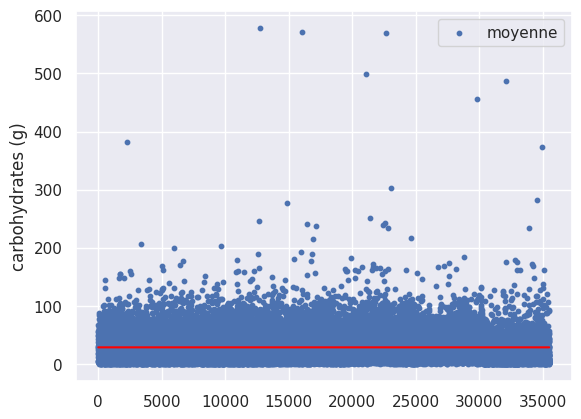

In [ ]:
carbohydrates = DATA_col2['carbohydrates_g'].to_numpy()
x = np.arange(35516)
plt.scatter(x,carbohydrates,s=10)
plt.ylabel('carbohydrates (g)')
plt.plot(DATA_col2['carbohydrates_g'].mean()*np.ones(len(carbohydrates)), 'red')
plt.legend(['moyenne'])
plt.show()

In [ ]:
DATA_col2["carbohydrates_g"].fillna(DATA_col2["carbohydrates_g"].mean())

name
Simple Macaroni and Cheese                                                                                              55.000000
Gourmet Mushroom Risotto                                                                                                56.600000
Dessert Crepes                                                                                                          17.200000
Pork Steaks                                                                                                              3.900000
Quick and Easy Pizza Crust                                                                                              28.100000
Chicken Parmesan                                                                                                        24.800000
Easy Sausage Gravy and Biscuits                                                                                         30.800000
Homemade Mac and Cheese                                                              

In [ ]:
sugars = DATA_col2[['sugars_g','fat_g','saturated_fat_g','cholesterol_mg','protein_g','dietary_fiber_g','sodium_mg','calories_from_fat','calcium_mg','iron_mg','magnesium_mg','potassium_mg','vitamin_a_iu_IU','niacin_equivalents_mg','vitamin_c_mg','folate_mcg','thiamin_mg']]

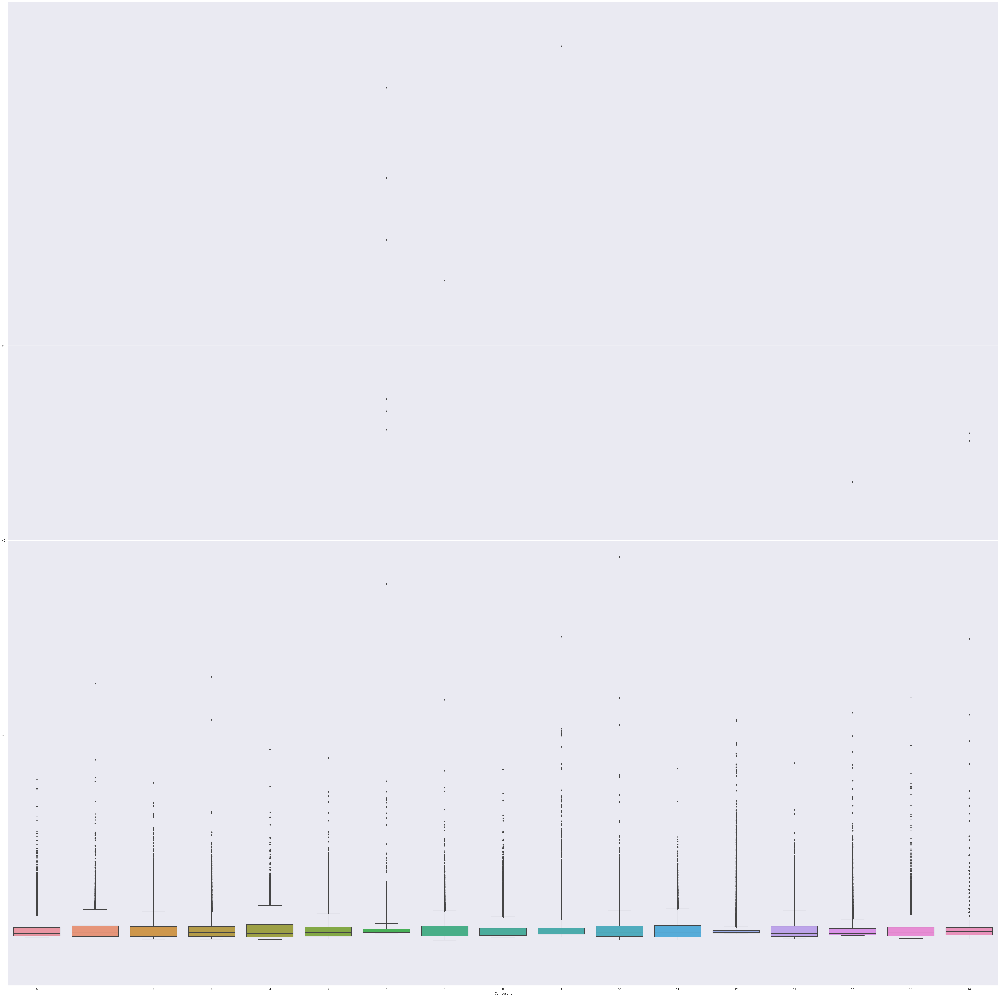

In [ ]:
scaler = StandardScaler()
scaler.fit(sugars)
sugars=scaler.transform(sugars)

plt.figure(figsize=(70,70))
sns.boxplot(sugars)
plt.xlabel('Composant')
plt.show()



Pour la variable 'carbohydrates_g', nous pouvons voir qu'il n'y a pas beaucoup de valeurs extrêmes et que les valeurs sont relativement bien ditribuées autour de la moyenne. Nous allons donc remplacer les valeurs manquantes par la moyenne.

Nous allons maintenant visualiser la répartition par rapport a la moyenne des autres variables afin de déterminer si nous remplacerons les valeurs manquantes par la moyenne ou la médiane.

In [ ]:
DATA_col2["sugars_g"].fillna(DATA_col2["sugars_g"].median())
DATA_col2["fat_g"].fillna(DATA_col2["fat_g"].median())
DATA_col2["saturated_fat_g"].fillna(DATA_col2["saturated_fat_g"].median())
DATA_col2["cholesterol_mg"].fillna(DATA_col2["cholesterol_mg"].median())
DATA_col2["protein_g"].fillna(DATA_col2["protein_g"].median())
DATA_col2["dietary_fiber_g"].fillna(DATA_col2["dietary_fiber_g"].median())
DATA_col2["sodium_mg"].fillna(DATA_col2["sodium_mg"].median())
DATA_col2["calories_from_fat"].fillna(DATA_col2["calories_from_fat"].median())
DATA_col2["calcium_mg"].fillna(DATA_col2["calcium_mg"].median())
DATA_col2["iron_mg"].fillna(DATA_col2["iron_mg"].median())
DATA_col2["magnesium_mg"].fillna(DATA_col2["magnesium_mg"].median())
DATA_col2["potassium_mg"].fillna(DATA_col2["potassium_mg"].median())
DATA_col2["vitamin_a_iu_IU"].fillna(DATA_col2["vitamin_a_iu_IU"].median())
DATA_col2["niacin_equivalents_mg"].fillna(DATA_col2["niacin_equivalents_mg"].median())
DATA_col2["vitamin_c_mg"].fillna(DATA_col2["vitamin_c_mg"].median())
DATA_col2["folate_mcg"].fillna(DATA_col2["folate_mcg"].median())
DATA_col2["thiamin_mg"].fillna(DATA_col2["thiamin_mg"].median())

name
Simple Macaroni and Cheese                                                                                              0.7
Gourmet Mushroom Risotto                                                                                                0.1
Dessert Crepes                                                                                                          0.2
Pork Steaks                                                                                                             0.7
Quick and Easy Pizza Crust                                                                                              0.3
Chicken Parmesan                                                                                                        0.1
Easy Sausage Gravy and Biscuits                                                                                         0.3
Homemade Mac and Cheese                                                                                                 0.5
Cla

Nous remarquons que la note attribuée aux recettes n'ayant aucun votant est automatiquement de 0 ce qui fausse la moyenne

In [ ]:
DATAratenul = DATA_col2[DATA_col2['rating_count'] == 0]
DATAratenul.head()
len(DATAratenul)

3460

Afin de pouvoir prochainement établir des liens entre les notes attribuées et d'autres variable, je crée un data frame spécifique à l'étude des notes :

In [ ]:
DATAnote = DATAcol.drop(DATAcol[(DATAcol['rating_count'] == 0)].index)
DATAnote.describe()

,rating,rating_count,review_count,servings,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg,riboflavin_mg,vitamin_e_iu_IU,vitamin_k_mcg,biotin_mcg,mono_fat_g,poly_fat_g,trans_fatty_acid_g
count,32053.000000,32053.000000,32053.000000,32053.000000,31955.000000,31924.000000,31443.000000,31665.000000,30948.000000,27014.000000,31817.000000,30803.000000,31940.000000,31633.000000,31929.000000,31559.000000,31879.000000,31927.000000,207.000000,205.000000,31453.000000,31447.000000,28968.000000,31778.000000,24639.000000,201.000000,203.000000,193.000000,120.000000,207.000000,207.000000,199.000000
mean,4.427385,154.293389,115.076654,10.470814,314.193325,28.429423,10.029552,16.580278,6.270635,71.880592,13.913615,2.725692,593.343003,149.127939,103.570293,2.289981,36.421158,361.381705,1.875362,85.658537,1330.004356,5.559506,16.309345,50.979637,0.241690,0.095025,0.688177,6.853368,1.639167,2.831884,1.367633,0.031156
std,0.437782,548.919159,397.659651,12.400947,209.357323,23.594935,13.003113,14.324237,6.355817,74.433454,13.949120,2.945624,1325.233828,139.144540,126.124261,3.163442,33.925009,342.373784,11.333729,163.109820,3319.850256,6.041731,28.669459,57.295899,0.258347,0.235532,1.360678,24.864296,2.959994,5.908127,3.555068,0.148848
min,1.000000,1.000000,0.000000,1.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.250000,8.000000,6.000000,4.000000,165.200000,10.900000,2.000000,6.700000,1.900000,21.500000,3.600000,0.800000,168.800000,59.700000,28.600000,0.900000,12.800000,110.000000,0.000000,5.400000,160.200000,1.500000,1.400000,14.200000,0.100000,0.000000,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000
50%,4.500000,30.000000,23.000000,8.000000,276.200000,24.100000,5.100000,13.200000,4.300000,51.800000,8.400000,1.800000,376.400000,118.300000,61.400000,1.700000,28.000000,261.400000,0.100000,21.500000,432.000000,3.200000,5.900000,34.300000,0.200000,0.000000,0.100000,0.500000,0.550000,0.100000,0.100000,0.000000
75%,4.680000,109.000000,84.000000,12.000000,417.500000,40.200000,13.100000,22.800000,8.600000,96.700000,21.700000,3.600000,775.125000,204.500000,125.200000,2.900000,50.100000,508.850000,0.500000,76.400000,1056.100000,7.900000,19.900000,66.675000,0.300000,0.100000,0.600000,2.800000,1.625000,2.500000,1.050000,0.000000
max,5.000000,19358.000000,13217.000000,832.000000,4709.200000,578.200000,212.700000,383.900000,103.400000,2016.700000,273.200000,55.000000,132119.100000,9478.900000,2182.900000,288.000000,1369.300000,6063.200000,153.200000,1126.400000,72542.200000,109.000000,1347.200000,1450.300000,13.300000,2.500000,10.000000,199.600000,18.200000,35.800000,29.600000,1.400000


Nous voyons que la moyenne a significativement été modifiée après la suppression des recettes sans votes (4.01 --> 4.43), cependant, certaines recettes ont beaucoup plus de votes que d'autres

####Traitement des valeurs abérantes

Je vais tout d'abbord m'interesser au valeurs du cholesterol. Grâce aux boites à moustache, on peut voir que plusieurs valeurs semblant abérantes sont présentes. Cependant je décide de ne m'interresser qu'aux recettes contenant un taux de cholesterol supérieur à 800mg après m'être renseignée sur les valeurs pouvant être atteintes pour un repas.


In [ ]:
DATAcholesterol = DATA_col2[DATA_col2['cholesterol_mg'] > 800]
DATAcholesterol[['cholesterol_mg']]

,cholesterol_mg
name,
Easy Homemade Pastrami,979.8
Shrimp and Green Chile Quesadilla,2016.7
"Shrimp, Avocado, and Grapefruit Salad",1685.8
Boiled Crawfish,971.3
Chicken Livers with Pomegranate Molasses,820.6
Chicken Livers with Bacon,821.2


Après vérification, les taux de cholesterol ne semblent pas être des valeurs aberrante (par exemple les crevettes représentent un apport de 209mg/100g ce qui peut expliquer la valeur assez élevée de cholestérol).

Au vu de l'aspect des boîtes à moustaches, certaines catégories vont nécessiter la supression d'outliers (exemple du sodium avec un maximum de 132119 mg ce qui semble être une erreur car la quantité maximale de sodium devant être ingérée par jour est d'environ 1500 mg, l'ordre de grandeur n'est pas respecté)

In [ ]:
DATA_col2= DATA_col2[DATA_col2['sodium_mg']<DATA_col2['sodium_mg'].quantile(0.95)]
DATA_col2.describe()

,rating,rating_count,review_count,servings,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg
count,33615.000000,33615.000000,33615.000000,33615.000000,33615.000000,33584.000000,33076.000000,33330.000000,32567.000000,28273.000000,33480.000000,32390.000000,33615.000000,33302.000000,33590.000000,33194.000000,33539.000000,33589.000000,199.000000,197.000000,33097.000000,33074.000000,30353.000000,33435.000000,25594.000000
mean,4.018767,140.900640,105.225167,10.703585,300.969478,27.798922,10.070589,15.860192,6.020515,68.745421,12.912939,2.648713,467.856644,142.688463,97.203766,2.133464,34.937029,343.560300,0.686432,63.251269,1306.419721,5.186763,15.941890,49.496384,0.231011
std,1.344112,531.777936,385.553568,12.444941,190.428660,22.743745,13.085793,13.228146,6.026909,69.699531,12.679398,2.835693,395.685797,129.609960,113.489984,2.362003,32.826121,326.055892,1.527613,94.581363,3299.944855,5.634039,27.926834,55.834099,0.240155
min,0.000000,0.000000,0.000000,1.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000,0.100000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.120000,4.000000,3.000000,4.000000,161.100000,10.700000,1.900000,6.500000,1.800000,20.500000,3.500000,0.800000,159.400000,58.400000,27.700000,0.800000,12.200000,105.300000,0.000000,5.300000,156.800000,1.400000,1.300000,13.800000,0.100000
50%,4.480000,23.000000,18.000000,8.000000,268.300000,23.600000,5.000000,12.800000,4.200000,49.300000,7.800000,1.800000,347.000000,114.800000,59.400000,1.600000,26.800000,245.500000,0.100000,21.500000,417.300000,3.000000,5.700000,33.500000,0.200000
75%,4.670000,95.000000,73.000000,12.000000,402.100000,39.400000,13.200000,21.900000,8.300000,93.200000,20.100000,3.500000,691.650000,197.000000,119.900000,2.800000,48.300000,485.000000,0.500000,75.100000,1024.900000,7.300000,19.300000,64.450000,0.300000
max,5.000000,19358.000000,13217.000000,832.000000,2707.700000,570.500000,212.700000,243.700000,81.700000,821.200000,176.000000,55.000000,1714.500000,9478.900000,1874.300000,97.200000,1369.300000,4907.700000,11.100000,503.900000,72542.200000,61.400000,1347.200000,1450.300000,13.300000


J'ai choisi un quantile à 0.95 afin de garder des valeurs raisonnable en sodium et de conserver suffisamment de données même si un grand nombre ont du être supprimées.

Par manque de temps je me concentrerai uniquement sur les catégories contenant des valeurs vraiment excesseive soit : calories, iron, vitamine c, thiamine.
Je prendrai des quantiles de 0.98 pour n'enlever que les valeurs me semblant être des erreurs de saisies.


In [ ]:
DATA_col2= DATA_col2[DATA_col2['calories_from_fat']<DATA_col2['calories_from_fat'].quantile(0.98)]
DATA_col2= DATA_col2[DATA_col2['iron_mg']<DATA_col2['iron_mg'].quantile(0.98)]
DATA_col2= DATA_col2[DATA_col2['vitamin_c_mg']<DATA_col2['vitamin_c_mg'].quantile(0.98)]
DATA_col2= DATA_col2[DATA_col2['thiamin_mg']<DATA_col2['thiamin_mg'].quantile(0.98)]
DATA_col2.describe()

,rating,rating_count,review_count,servings,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg
count,21135.000000,21135.000000,21135.000000,21135.000000,21135.000000,21131.000000,20976.000000,21134.000000,20981.000000,18489.000000,21135.000000,20933.000000,21135.000000,21135.000000,21135.000000,21135.000000,21135.000000,21135.000000,0.0,0.0,21089.000000,21134.000000,21135.000000,21135.000000,21135.000000
mean,4.035379,151.260468,112.008138,8.863307,324.275879,30.498841,10.647797,16.469291,6.088061,71.702612,14.495453,2.997086,521.060402,148.217483,109.770083,2.220237,40.173243,399.483946,NaN,NaN,1508.173498,5.951689,14.826780,56.461136,0.203691
std,1.320661,585.834939,420.970902,7.612784,157.265944,21.562851,13.388952,10.875236,5.325110,65.313902,11.973527,2.762133,392.663721,97.879508,112.898774,1.408668,28.934116,297.351115,NaN,NaN,3484.655397,5.464531,19.022886,48.521216,0.132849
min,0.000000,0.000000,0.000000,1.000000,8.900000,0.100000,0.100000,0.100000,0.100000,0.100000,0.200000,0.100000,0.100000,0.300000,0.800000,0.100000,0.600000,4.900000,NaN,NaN,0.100000,0.100000,0.100000,0.100000,0.100000
25%,4.140000,5.000000,3.000000,4.000000,206.200000,14.400000,2.400000,8.000000,2.000000,26.700000,4.800000,1.200000,211.250000,72.300000,39.500000,1.200000,19.700000,180.550000,NaN,NaN,222.400000,2.100000,1.600000,24.500000,0.100000
50%,4.470000,25.000000,19.000000,8.000000,304.400000,27.400000,5.300000,14.400000,4.600000,55.800000,10.500000,2.200000,411.600000,129.500000,72.300000,1.900000,33.600000,331.500000,NaN,NaN,531.100000,3.900000,6.600000,42.900000,0.200000
75%,4.670000,103.000000,78.000000,12.000000,420.450000,42.000000,13.800000,23.075000,8.600000,96.100000,22.200000,3.900000,761.300000,207.450000,134.100000,3.000000,53.000000,534.200000,NaN,NaN,1203.900000,8.200000,21.000000,72.500000,0.300000
max,5.000000,19358.000000,13217.000000,216.000000,1226.300000,570.000000,212.700000,50.800000,36.900000,678.300000,130.000000,27.700000,1714.500000,457.300000,1515.400000,7.300000,865.300000,2863.300000,NaN,NaN,72219.200000,58.200000,95.800000,731.800000,0.700000


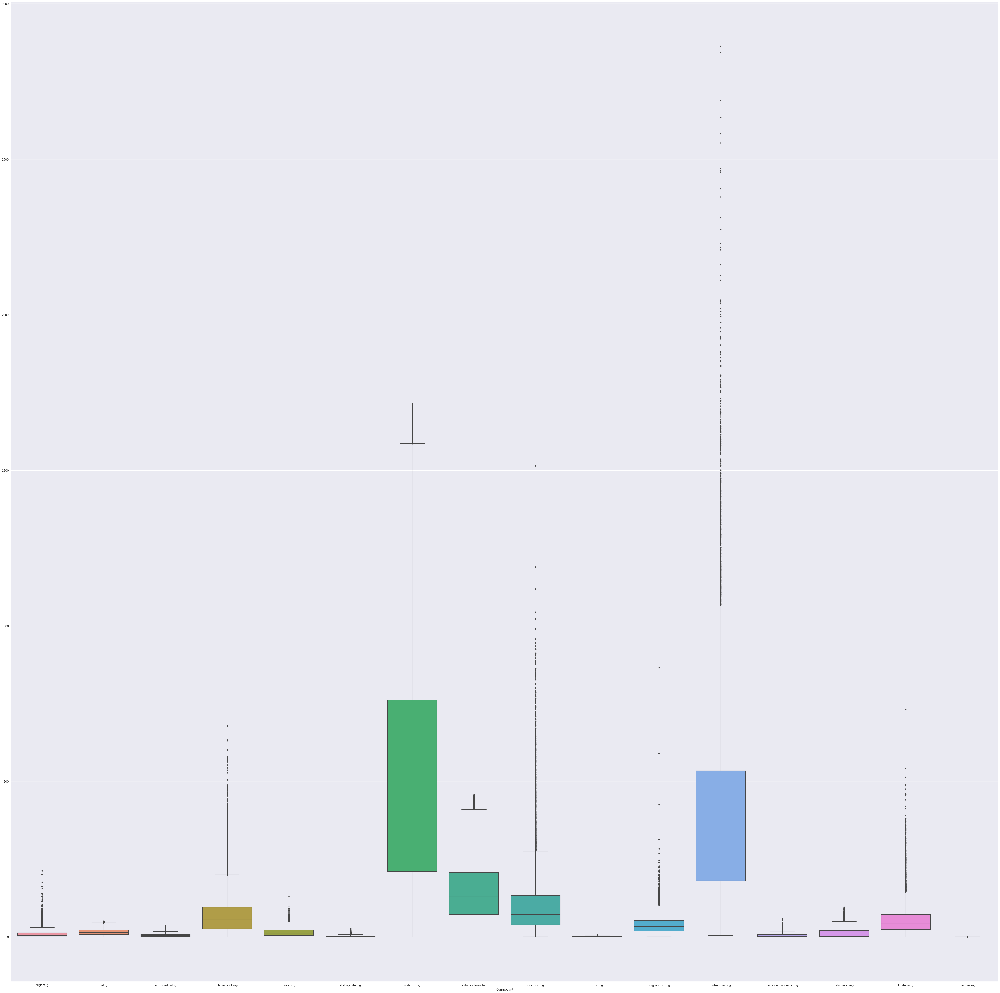

In [ ]:
sugars2 = DATA_col2[['sugars_g','fat_g','saturated_fat_g','cholesterol_mg','protein_g','dietary_fiber_g','sodium_mg','calories_from_fat','calcium_mg','iron_mg','magnesium_mg','potassium_mg','niacin_equivalents_mg','vitamin_c_mg','folate_mcg','thiamin_mg']]
scaler = StandardScaler()
scaler.fit(sugars2)
sugars=scaler.transform(sugars2)

plt.figure(figsize=(70,70))
sns.boxplot(sugars2)
plt.xlabel('Composant')
plt.show()


### Première visualisation des corrélations entre les variables

Je vais créer un Data frame combinant celui des notes et celui où les données manquantes / abérantes ont été traitées.

In [ ]:
DATA_col2.describe()

,rating,rating_count,review_count,servings,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg
count,21135.000000,21135.000000,21135.000000,21135.000000,21135.000000,21131.000000,20976.000000,21134.000000,20981.000000,18489.000000,21135.000000,20933.000000,21135.000000,21135.000000,21135.000000,21135.000000,21135.000000,21135.000000,0.0,0.0,21089.000000,21134.000000,21135.000000,21135.000000,21135.000000
mean,4.035379,151.260468,112.008138,8.863307,324.275879,30.498841,10.647797,16.469291,6.088061,71.702612,14.495453,2.997086,521.060402,148.217483,109.770083,2.220237,40.173243,399.483946,NaN,NaN,1508.173498,5.951689,14.826780,56.461136,0.203691
std,1.320661,585.834939,420.970902,7.612784,157.265944,21.562851,13.388952,10.875236,5.325110,65.313902,11.973527,2.762133,392.663721,97.879508,112.898774,1.408668,28.934116,297.351115,NaN,NaN,3484.655397,5.464531,19.022886,48.521216,0.132849
min,0.000000,0.000000,0.000000,1.000000,8.900000,0.100000,0.100000,0.100000,0.100000,0.100000,0.200000,0.100000,0.100000,0.300000,0.800000,0.100000,0.600000,4.900000,NaN,NaN,0.100000,0.100000,0.100000,0.100000,0.100000
25%,4.140000,5.000000,3.000000,4.000000,206.200000,14.400000,2.400000,8.000000,2.000000,26.700000,4.800000,1.200000,211.250000,72.300000,39.500000,1.200000,19.700000,180.550000,NaN,NaN,222.400000,2.100000,1.600000,24.500000,0.100000
50%,4.470000,25.000000,19.000000,8.000000,304.400000,27.400000,5.300000,14.400000,4.600000,55.800000,10.500000,2.200000,411.600000,129.500000,72.300000,1.900000,33.600000,331.500000,NaN,NaN,531.100000,3.900000,6.600000,42.900000,0.200000
75%,4.670000,103.000000,78.000000,12.000000,420.450000,42.000000,13.800000,23.075000,8.600000,96.100000,22.200000,3.900000,761.300000,207.450000,134.100000,3.000000,53.000000,534.200000,NaN,NaN,1203.900000,8.200000,21.000000,72.500000,0.300000
max,5.000000,19358.000000,13217.000000,216.000000,1226.300000,570.000000,212.700000,50.800000,36.900000,678.300000,130.000000,27.700000,1714.500000,457.300000,1515.400000,7.300000,865.300000,2863.300000,NaN,NaN,72219.200000,58.200000,95.800000,731.800000,0.700000


In [ ]:
DATAnote.describe()

,rating,rating_count,review_count,servings,calories,carbohydrates_g,sugars_g,fat_g,saturated_fat_g,cholesterol_mg,protein_g,dietary_fiber_g,sodium_mg,calories_from_fat,calcium_mg,iron_mg,magnesium_mg,potassium_mg,zinc_mg,phosphorus_mg,vitamin_a_iu_IU,niacin_equivalents_mg,vitamin_c_mg,folate_mcg,thiamin_mg,riboflavin_mg,vitamin_e_iu_IU,vitamin_k_mcg,biotin_mcg,mono_fat_g,poly_fat_g,trans_fatty_acid_g
count,32053.000000,32053.000000,32053.000000,32053.000000,31955.000000,31924.000000,31443.000000,31665.000000,30948.000000,27014.000000,31817.000000,30803.000000,31940.000000,31633.000000,31929.000000,31559.000000,31879.000000,31927.000000,207.000000,205.000000,31453.000000,31447.000000,28968.000000,31778.000000,24639.000000,201.000000,203.000000,193.000000,120.000000,207.000000,207.000000,199.000000
mean,4.427385,154.293389,115.076654,10.470814,314.193325,28.429423,10.029552,16.580278,6.270635,71.880592,13.913615,2.725692,593.343003,149.127939,103.570293,2.289981,36.421158,361.381705,1.875362,85.658537,1330.004356,5.559506,16.309345,50.979637,0.241690,0.095025,0.688177,6.853368,1.639167,2.831884,1.367633,0.031156
std,0.437782,548.919159,397.659651,12.400947,209.357323,23.594935,13.003113,14.324237,6.355817,74.433454,13.949120,2.945624,1325.233828,139.144540,126.124261,3.163442,33.925009,342.373784,11.333729,163.109820,3319.850256,6.041731,28.669459,57.295899,0.258347,0.235532,1.360678,24.864296,2.959994,5.908127,3.555068,0.148848
min,1.000000,1.000000,0.000000,1.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.250000,8.000000,6.000000,4.000000,165.200000,10.900000,2.000000,6.700000,1.900000,21.500000,3.600000,0.800000,168.800000,59.700000,28.600000,0.900000,12.800000,110.000000,0.000000,5.400000,160.200000,1.500000,1.400000,14.200000,0.100000,0.000000,0.000000,0.100000,0.100000,0.000000,0.000000,0.000000
50%,4.500000,30.000000,23.000000,8.000000,276.200000,24.100000,5.100000,13.200000,4.300000,51.800000,8.400000,1.800000,376.400000,118.300000,61.400000,1.700000,28.000000,261.400000,0.100000,21.500000,432.000000,3.200000,5.900000,34.300000,0.200000,0.000000,0.100000,0.500000,0.550000,0.100000,0.100000,0.000000
75%,4.680000,109.000000,84.000000,12.000000,417.500000,40.200000,13.100000,22.800000,8.600000,96.700000,21.700000,3.600000,775.125000,204.500000,125.200000,2.900000,50.100000,508.850000,0.500000,76.400000,1056.100000,7.900000,19.900000,66.675000,0.300000,0.100000,0.600000,2.800000,1.625000,2.500000,1.050000,0.000000
max,5.000000,19358.000000,13217.000000,832.000000,4709.200000,578.200000,212.700000,383.900000,103.400000,2016.700000,273.200000,55.000000,132119.100000,9478.900000,2182.900000,288.000000,1369.300000,6063.200000,153.200000,1126.400000,72542.200000,109.000000,1347.200000,1450.300000,13.300000,2.500000,10.000000,199.600000,18.200000,35.800000,29.600000,1.400000


In [ ]:
DATApropre = DATAnote + DATA_col2
DATApropre.drop_duplicates()

In [ ]:
DATApropre.describe()

In [ ]:
DATApropre2 = DATApropre.drop(columns = ["riboflavin_mg","biotin_mcg","mono_fat_g","phosphorus_mg","poly_fat_g","trans_fatty_acid_g","vitamin_e_iu_IU","vitamin_k_mcg","zinc_mg"],axis=1)
DATApropre2.head()

<ipython-input-146-7def75e0d095>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  x = DATApropre2.sub(DATApropre2.mean())
<ipython-input-146-7def75e0d095>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(x.corr(), vmin = -1, vmax = 1, cmap = 'coolwarm', square = True, annot = True)


<Axes: >

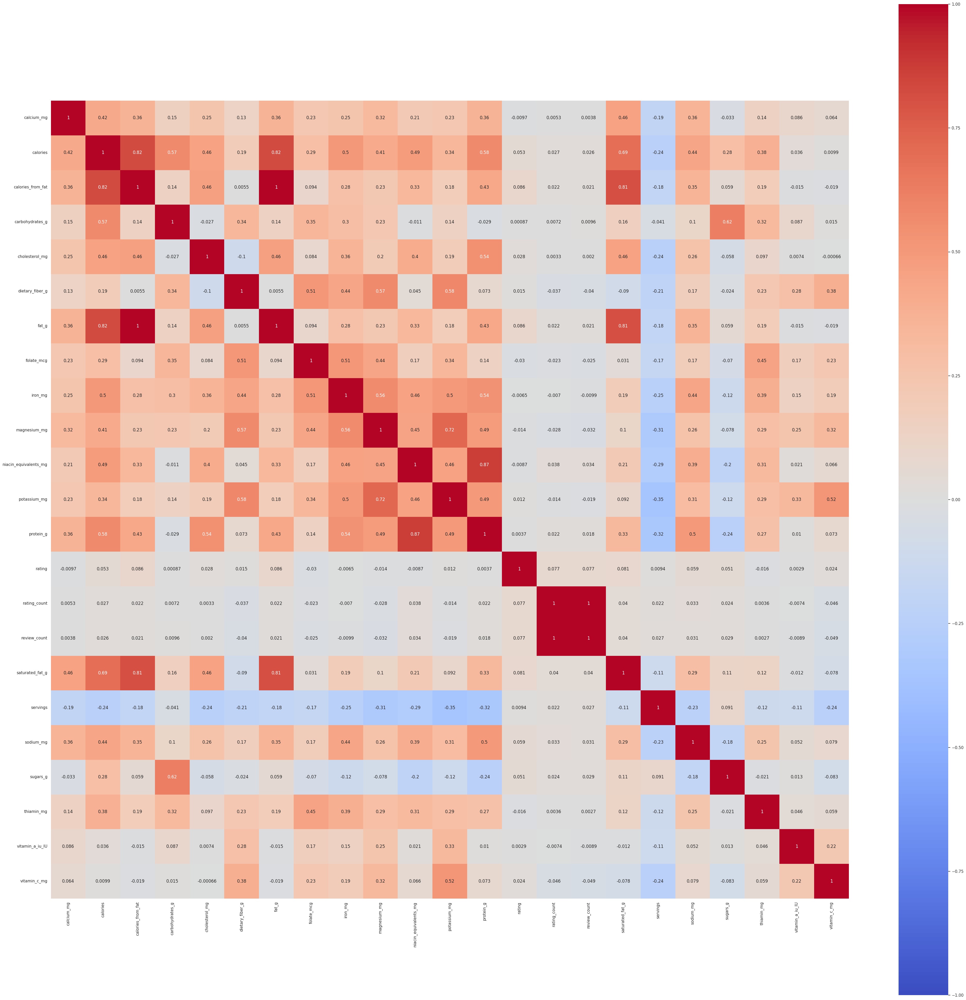

In [ ]:
x = DATApropre2.sub(DATApropre2.mean())
x = x.div(x.std())
plt.figure(figsize = (50,50))
sns.heatmap(x.corr(), vmin = -1, vmax = 1, cmap = 'coolwarm', square = True, annot = True)

### Commentaires


Nous pouvons voir qu'après nettoyage, un grand nombre de données ont été supprimées, il aurait peut-être été préférable de remplacer certaines valeurs qui ont été supprimées pas des NaN afin de conserver un plus grand nombre de recette.

Il resterait encore un travail a effectuer afin d'harmoniser les unités de temps pour les durées de préparation afin de pouvoir effectuer des comparaison entre les recettes.

# Analyse des données :

Nous allons maintenant tenter de trouver des corrélations entre différentes variables et analyser le comportement de différentes sous population.
Nous allons emettre plusieurs problématiques afin d'axer les analyses prochainement entreprises. La matrice de corrélation vue dans la partie précédente ne me permet pas forcément de conclure facilement sur les variables à confronter. En effet, seulement certaines variables évidemment corrélées tel que : saturated_fat_g / fat_g ou encore calories_from_fat / fat_g pourraient être étudiées mais cela ne me parrait pas pertinent.

Les problématiques seront donc les suivantes :
- Pouvons nous déceler un lien entre la nature du repas (petit déjeuner, diner...) et l'appréciation des utilisateurs afin de savoir si une catégorie de repas est plus ou moins appréciée par les consommateurs.
- Quels sont les liens entre le nombre de notes, le nombre de commentaires, et la note obtenue par le repas.
- Y'a-t-il une alternative à la consommation de viande qui garantisse un apport suffisant en protéine ?



### Nature du repas :


Commençons par créer différents dataframes pour chaque catégorie ce qui facilitera la représentation graphique des données.

In [ ]:
DATArepas = DATApropre2[['category','rating','rating_count']]
DATArepas.head()

,category,rating,rating_count
name,,,
"""AWW NUTS!"" Pecan Pie Minis",dessertsdesserts,6.00,2.0
"""Burnt"" Basque Cheesecake",dessertsdesserts,9.60,60.0
"""Code Red"" Cheese Spread",NaN,NaN,NaN
"""Dirt Pudding"" Pumpkin Patch",dessertsdesserts,9.74,30.0
"""Doritos®"" Popcorn",NaN,NaN,NaN


In [ ]:
DATArepas = DATArepas.dropna(subset = ['category'])
DATArepas.head()

,category,rating,rating_count
name,,,
"""AWW NUTS!"" Pecan Pie Minis",dessertsdesserts,6.00,2.0
"""Burnt"" Basque Cheesecake",dessertsdesserts,9.60,60.0
"""Dirt Pudding"" Pumpkin Patch",dessertsdesserts,9.74,30.0
"""Everything"" Seasoning Air Fryer Asparagus",side-dishside-dish,10.00,2.0
"""HAVE MERCY!"" Triple Chocolate Cake",dessertsdesserts,9.20,10.0


In [ ]:
resultat = DATArepas.groupby('category').nunique()
print(resultat)

                                                    rating  rating_count
category                                                                
appetizers-and-snacksappetizers-and-snacks             183           311
bbq-grillingbbq-grilling                                 1             1
breadbread                                             182           382
breakfast-and-brunchbreakfast-and-brunch               144           353
dessertsdesserts                                       131           510
drinksdrinks                                            71            75
everyday-cookingeveryday-cooking                        98           146
fruits-and-vegetablesfruits-and-vegetables              71           114
holidays-and-eventsholidays-and-events                   2             2
ingredientsingredients                                   1             1
main-dishmain-dish                                     148           482
meat-and-poultrymeat-and-poultry                   

In [ ]:
DATArepas.set_index(['category'], inplace = True)
DATArepas.head()

,rating,rating_count
category,,
dessertsdesserts,6.00,2.0
dessertsdesserts,9.60,60.0
dessertsdesserts,9.74,30.0
side-dishside-dish,10.00,2.0
dessertsdesserts,9.20,10.0


In [ ]:
groups = DATArepas.groupby(DATArepas.index)
desserts_df = groups.get_group("dessertsdesserts")
app_df = groups.get_group("appetizers-and-snacksappetizers-and-snacks")
bbq_df = groups.get_group("bbq-grillingbbq-grilling")
bread_df = groups.get_group("breadbread")
bf_df = groups.get_group("breakfast-and-brunchbreakfast-and-brunch")
drinks_df = groups.get_group("drinksdrinks")
evd_df = groups.get_group("everyday-cookingeveryday-cooking")
fv_df = groups.get_group("fruits-and-vegetablesfruits-and-vegetables")
holidays_df = groups.get_group("holidays-and-eventsholidays-and-events")
igd_df = groups.get_group("ingredientsingredients")
maindish_df = groups.get_group("main-dishmain-dish")
meat_df = groups.get_group("meat-and-poultrymeat-and-poultry")
pasta_df = groups.get_group("pasta-and-noodlespasta-and-noodles")
salad_df = groups.get_group("saladsalad")
sea_df = groups.get_group("seafoodseafood")
side_df = groups.get_group("side-dishside-dish")
sidetips_df = groups.get_group("side-dishtrusted-brands-recipes-and-tips")
soups_df = groups.get_group("soups-stews-and-chilisoups-stews-and-chili")
brands_df = groups.get_group("trusted-brands-recipes-and-tipsside-dish")
un_df = groups.get_group("uncategorizeduncategorized")
world_df = groups.get_group("world-cuisineworld-cuisine")

app_df.head()


,rating,rating_count
category,,
bbq-grillingbbq-grilling,10.0,2.0


Après avoir créé un dataframe pour chaque catégorie de plats, je vais maintenant calculer chaque moyenne afin de la représenter en fonction de la catégorie de plat.

In [ ]:
y=[]
y.append(app_df['rating'].mean())
y.append(desserts_df['rating'].mean())
y.append(bbq_df['rating'].mean())
y.append(bread_df['rating'].mean())
y.append(bf_df['rating'].mean())
y.append(drinks_df['rating'].mean())
y.append(evd_df['rating'].mean())
y.append(fv_df['rating'].mean())
y.append(holidays_df['rating'].mean())
y.append(igd_df['rating'].mean())
y.append(maindish_df['rating'].mean())
y.append(meat_df['rating'].mean())
y.append(pasta_df['rating'].mean())
y.append(salad_df['rating'].mean())
y.append(sea_df['rating'].mean())
y.append(side_df['rating'].mean())
y.append(sidetips_df['rating'].mean())
y.append(soups_df['rating'].mean())
y.append(brands_df['rating'].mean())
y.append(un_df['rating'].mean())
y.append(world_df['rating'].mean())

print(y)
x = ['appetizers-and-snacks','desserts','bbq-grilling','bread','breakfast-and-brunch','drinks','everyday-cooking','fruits-and-vegetables','holidays-and-events','ingredients','main-dish','meat-and-poultry','pasta-and-noodles','salad','seafood','side-dish','side-dishtrusted-brands-recipes-and-tips','soups-stews-and-chili','trusted-brands-recipes-and-tipsside-dish','uncategorized','world-cuisine']

[8.704304778303916, 8.965427631578947, 10.0, 8.729608416130917, 8.906980769230769, 8.957593984962408, 8.84548611111111, 9.063195266272189, 9.0, 9.0, 8.83518058690745, 8.889642857142858, 8.63220338983051, 8.888275862068966, 8.569403794037939, 8.93822169531713, 9.02, 8.948354155350355, 9.02, 9.215238095238094, 8.89947677522691]


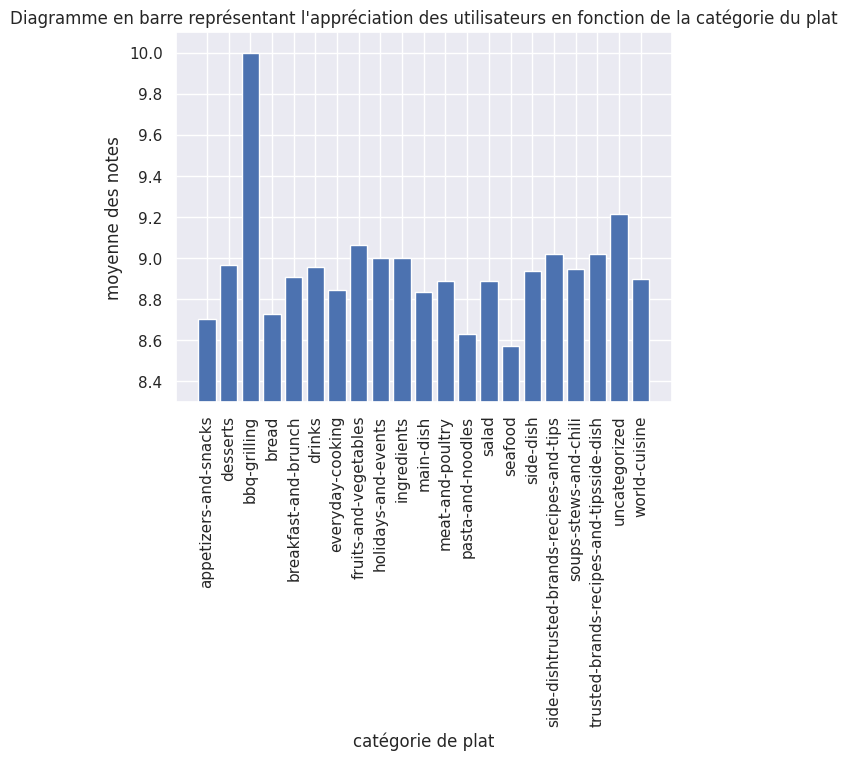

In [ ]:
plt.bar(x,y,bottom=0)
plt.ylim(bottom=8.3)
plt.ylim(top=10.1)
plt.xlabel('catégorie de plat')
plt.ylabel('moyenne des notes')
plt.title("Diagramme en barre représentant l'appréciation des utilisateurs en fonction de la catégorie du plat")
plt.xticks(rotation = 90)
plt.show()

Nous pouvons voir la tendance des moyennes, cependant, certaines catégories sont difficilement comparables car elles n'ont pas toutes le même nombre de recettes et le même nombre d'avis. Je vais donc essayer d'ajouter une variable qui est le nombre de recettes dans chaque catégorie.

In [ ]:
z = [len(app_df),len(desserts_df),len(bbq_df),len(bread_df),len(bf_df),len(drinks_df),len(evd_df),len(fv_df),len(holidays_df),len(igd_df),len(maindish_df),len(meat_df),len(pasta_df),len(salad_df),len(sea_df),len(side_df),len(sidetips_df),len(soups_df),len(brands_df),len(un_df),len(world_df)]
print(z)

[2323, 1824, 1, 1711, 1040, 133, 288, 169, 2, 1, 1772, 1232, 59, 1856, 738, 1687, 1, 1841, 1, 21, 1873]


In [ ]:
import plotly.graph_objects as go
fig = go.Figure(layout=dict(margin=dict(t=0, b=0, l=0, r=0)))
fig.add_trace(go.Scatter(x=x,y=y,marker_color=z,mode = 'markers', marker = dict(showscale = True, colorscale ='Jet',size = 15 )))
fig.show()

Grâce à cette représentation prenant en compte le nombre de recette par catégorie, nous pouvons faire les commentaires suivants :

La seule moyenne à 10 correspond à la caégorie barbecue qui ne contient qu'une seule recette ce qui n'est pas très représentatif de la catégorie.
Nous pouvons remarquer que les catégories contenant un grand nombre de recettes (à partir du rouge) ont des moyennes très légèrement plus basses que les catégories contenants moins de recettes (en bleu), ce qui peut être compréhensible car un plus grand nombre de recettes peuvent déplaires. La moyenne la plus basse est obtenue pour les recettes contenant des produits de la mer avec un nombre raisonnable de recettes (environ 1000).

## Lien entre la moyenne obtenue, le nombre de vote et le nombre de commentaires

L'objectif ici est de voir si les utilisateurs ont plutôt tendance à laisser des commentaires à propos des recettes qui ont été appréciées ou non.

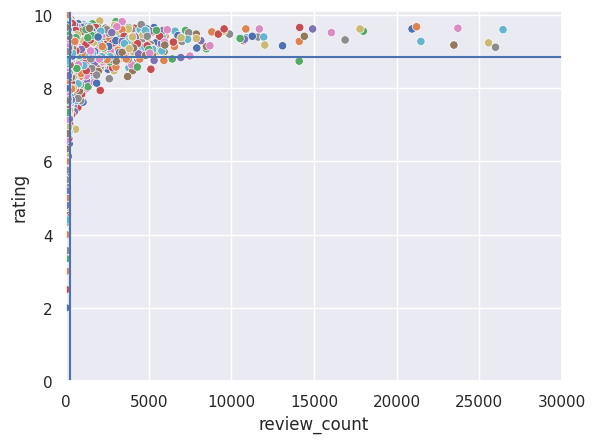

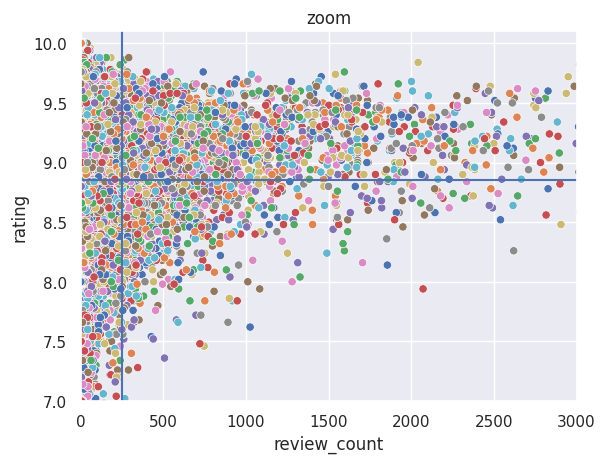

In [ ]:
DF = DATApropre2[['rating','rating_count','review_count']]
mean_rating = DF['rating'].mean()
mean_review = DF['review_count'].mean()

sns.scatterplot(x = 'review_count', y = 'rating', data=DF, hue = 'rating_count', legend = False, palette='deep')
plt.axhline(mean_rating)
plt.axvline(mean_review)
plt.ylim(bottom=0)
plt.ylim(top=10.1)
plt.xlim(left=0)
plt.xlim(right=30000)
plt.show()
mean_rating = DF['rating'].mean()
mean_review = DF['review_count'].mean()

sns.scatterplot(x = 'review_count', y = 'rating', data=DF, hue = 'rating_count', legend = False, palette='deep')
plt.axhline(mean_rating)
plt.axvline(mean_review)
plt.ylim(bottom=7)
plt.ylim(top=10.1)
plt.xlim(left=0)
plt.xlim(right= 3000)
plt.title('zoom')
plt.show()

Nous avons ici :

-En haut à droite : les recettes bien notées avec peu de commentaires

-En haut à gauche : les recettes bien notées avec beaucpup de commentaires

-En bas à gauche : les recettes mal notées avec peu de commentaires

-En bas à droite, les recettes mal notées avec beaucoup de commentaires.


Nous ne pouvons pas comprarer les recettes ayant peu de commentaires car les zones sont trop denses.
Cependant, nous pouvons voir que les utilisateurs ont tendances à laisser davantage d'avis lorsqu'ils sont satisfaits que lorsque la recette leur a moins plue.

## Alternatives à la viande

D'après le site https://guide-alimentaire.canada.ca/ consluté le 04/05/2023, des alternatives à la viande pour avoir un apport de protéine sont les poissons et les fruits de mer. Nous allons donc comparer les catégories meat et seafood afin de voir si il est pertinent de remplacer la viande par le poisson.

In [ ]:
DF2= DATApropre2[['category','protein_g']]
DF2.set_index(['category'], inplace = True)
prot = DF2.groupby(DF2.index)

meat_prot = prot.get_group("meat-and-poultrymeat-and-poultry")
sea_prot = prot.get_group("seafoodseafood")
meat_prot.head()

,protein_g
category,
meat-and-poultrymeat-and-poultry,29.4
meat-and-poultrymeat-and-poultry,64.4
meat-and-poultrymeat-and-poultry,55.2
meat-and-poultrymeat-and-poultry,144.4
meat-and-poultrymeat-and-poultry,101.8


In [ ]:
x=meat_prot['protein_g'].to_numpy()
y=sea_prot['protein_g'].to_numpy()
fig = go.Figure(layout=dict(margin=dict(t=0, b=0, l=0, r=0)))
fig.add_trace(go.Box(x=x,name='Viande',boxmean=True))
fig.update_traces(orientation='h')
fig.add_trace(go.Box(x=y, name ='Poisson et fruits de mer',boxmean=True))

fig.show()

Nous pouvons voir ici que le poisson et les fruits de mer peuvent effectivement être une alternative à la viande pour l'apport de protéine dans l'alimentation. Plus de recettes contenant de la viande ont de très grandes quantités de protéines, cependant, nous pouvons voir que les moyennes et médianes de ces catégories sont très proches. Il y a globalement dans les données plus de recettes de viandes que de poisson, il faudrait en avoir autant pour pouvoir réellement comparer leurs apports mais ces données nous permettent de confirmer l'information trouvée précédemment sur internet.

Nous pouvons étendre cette problématique à d'autres catégories :

In [ ]:
fv_prot = prot.get_group("fruits-and-vegetablesfruits-and-vegetables")
pasta_prot = prot.get_group("pasta-and-noodlespasta-and-noodles")
salad_prot = prot.get_group("saladsalad")

a=fv_prot['protein_g'].to_numpy()
b=pasta_prot['protein_g'].to_numpy()
c=salad_prot['protein_g'].to_numpy()
fig = go.Figure(layout=dict(margin=dict(t=0, b=0, l=0, r=0)))
fig.add_trace(go.Box(x=a,name='Fruits et légumes',boxmean=True))
fig.add_trace(go.Box(x=x,name='Viande',boxmean=True))
fig.add_trace(go.Box(x=b, name ='Pates',boxmean=True))
fig.add_trace(go.Box(x=c,name='Salades',boxmean=True))
fig.update_traces(orientation='h')
fig.show()

En comparaison avec la viande (en rouge), seules les pâtes semblent envisageable pour avoir un apport suffisant en protéines. Cependant, je pense que ces résultats ne sont pas corrects car certaines recettes de pâtes peuvent contenir de la viande (pâtes bolognaises par exemple). En effet, d'après https://fdc.nal.usda.gov/ consulté le 04/05/2023, une portion de 100g de pâte aurait un apport d'environ 5g de protéine alors qu'un steack de 100g en apporte 25.


## Conclusion

Grâce à cette phase d'analyse, nous avons pu répondre aux problématiques qui étaient :
- Pouvons nous déceler un lien entre la nature du repas (petit déjeuner, diner...) et l'appréciation des utilisateurs afin de savoir si une catégorie de repas est plus ou moins appréciée par les consommateurs.
- Quels sont les liens entre le nombre de notes, le nombre de commentaires, et la note obtenue par le repas.
- Y'a-t-il une alternative à la consommation de viande qui garantisse un apport suffisant en protéine ?

La première problématique a trouvé réponse grâce a une représentation 3D confrontant le type de repas, la moyenne de ses notes et le nombre de recettes présentes dans cette catégorie. Nous avons pu globalement voir que les moyennes étaient relativement proche entre les catégories hormis pour celle des barbecue et grillade mais qui ne peut pas réellement être exploitée car cette catégorie ne contient qu'une recette.

Nous avons ensuite vu que les recettes ayant des avis favorables etaient plus fréquemment commentées que les autres.

Pour finir, nous avons montrés qu'il était possible de renoncer à la viande en accompagnant ses repas de poissons et de fruits de mer. Cependant nous ne pouvons pas montrer grâce à ces données qu'il est possible de renoncer à la contribution animal, il aurait fallu une catégorie suplémentaire avec des légumes secs ou encore des féculents complets.